## Imports

In [39]:
import pandas as pd
import numpy as np
import chart_studio.plotly as py
import plotly.express as px
import cufflinks as cf
import seaborn as sns
import plotly.graph_objects as go

%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline() 

## Basics

<Axes: >

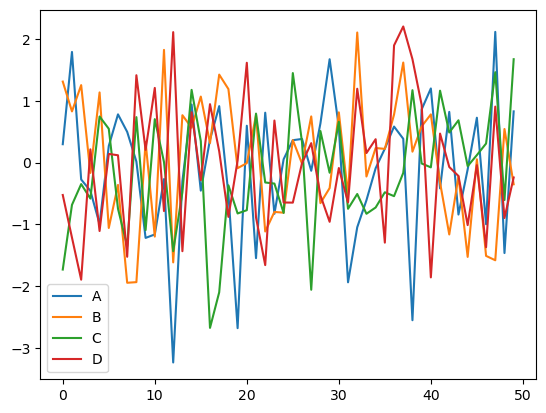

In [40]:
arr_1 = np.random.randn(50,4)
df_1 = pd.DataFrame(arr_1, columns=['A','B','C','D'])
df_1.head()
df_1.plot()

In [41]:
df_1.iplot()

## Line Plots

In [42]:
df_stocks = px.data.stocks()
df_stocks.head()

,date,GOOG,AAPL,AMZN,FB,NFLX,MSFT
0,2018-01-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2018-01-08,1.018172,1.011943,1.061881,0.959968,1.053526,1.015988
2,2018-01-15,1.032008,1.019771,1.053240,0.970243,1.049860,1.020524
3,2018-01-22,1.066783,0.980057,1.140676,1.016858,1.307681,1.066561
4,2018-01-29,1.008773,0.917143,1.163374,1.018357,1.273537,1.040708


In [43]:
px.line(df_stocks, x='date', y='GOOG', labels={'x': 'Date', 'y':'Price'})
px.line(df_stocks, x='date', y=['GOOG','AAPL'], labels={'x': 'Date', 'y':'Price'}, title='Apple vs. Google')
px.line(df_stocks, x='date', y='GOOG', labels={'x': 'Date', 'y':'Price'})
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL, mode='lines', name='Apple'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN, mode='lines+markers', name='Amazon'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG, mode='lines+markers', name='Google', line=dict(color='firebrick', width=2, dash='dashdot')))

fig.update_layout(title='Stock Price Data 2018-2020', xaxis_title='Price', yaxis_title='Date')

## Bar Charts

In [44]:
df_us = px.data.gapminder()
df_us.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4


In [45]:
df_us = px.data.gapminder().query("country=='United States'")
df_us.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
1608,United States,Americas,1952,68.44,157553000,13990.48208,USA,840
1609,United States,Americas,1957,69.49,171984000,14847.12712,USA,840
1610,United States,Americas,1962,70.21,186538000,16173.14586,USA,840
1611,United States,Americas,1967,70.76,198712000,19530.36557,USA,840
1612,United States,Americas,1972,71.34,209896000,21806.03594,USA,840


In [46]:
px.bar(df_us, x = 'year', y='pop')

In [47]:
df_tips = px.data.tips()
df_tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [48]:
px.bar(df_tips, x='day', y='tip', color='sex', title='Tips by Sex on Each Day', labels={'tip':'Tip Amount', 'day': "Day of the Week"})

In [49]:
px.bar(df_tips, x='day', y='tip', color='sex',barmode='group', title='Tips by Sex on Each Day', labels={'tip':'Tip Amount', 'day': "Day of the Week"})

In [50]:
px.bar(df_tips, x='sex', y='total_bill', color='smoker', barmode='group')

In [51]:
df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2.e6")
df_europe.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
23,Albania,Europe,2007,76.423,3600523,5937.029526,ALB,8
83,Austria,Europe,2007,79.829,8199783,36126.492700,AUT,40
119,Belgium,Europe,2007,79.441,10392226,33692.605080,BEL,56
155,Bosnia and Herzegovina,Europe,2007,74.852,4552198,7446.298803,BIH,70
191,Bulgaria,Europe,2007,73.005,7322858,10680.792820,BGR,100


In [52]:
fig = px.bar(df_europe, y='pop', x='country', text = 'pop', color = 'country')
fig

In [53]:
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8)
fig

In [54]:
fig.update_layout(xaxis_tickangle=-45)
fig

## Scatter Plots

In [55]:
df_iris = px.data.iris()
df_iris.head(1000)

,sepal_length,sepal_width,petal_length,petal_width,species,species_id
0,5.1,3.5,1.4,0.2,setosa,1
1,4.9,3.0,1.4,0.2,setosa,1
2,4.7,3.2,1.3,0.2,setosa,1
3,4.6,3.1,1.5,0.2,setosa,1
4,5.0,3.6,1.4,0.2,setosa,1
...,...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica,3
146,6.3,2.5,5.0,1.9,virginica,3
147,6.5,3.0,5.2,2.0,virginica,3
148,6.2,3.4,5.4,2.3,virginica,3


In [56]:
px.scatter(df_iris, x='sepal_width', y='sepal_length', color='species', 
           size='petal_length', hover_data=['petal_width'])

In [57]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df_iris.sepal_width, y = df_iris.sepal_length, 
    mode='markers',
    marker_color = df_iris.sepal_width,
    text=df_iris.species, marker=dict(showscale=True)))
fig.update_traces(marker_line_width=2, marker_size=10)

In [58]:
fig = go.Figure(data=go.Scattergl(
    x = np.random.randn(100000),
    y = np.random.randn(100000), 
    mode = 'markers',
    marker=dict(
        color = np.random.randn(100000),
        colorscale='Viridis',
        line_width=1
    )
))
fig

## Pie Charts

In [59]:
df_asia = px.data.gapminder().query('year==2007').query("continent == 'Asia'")
px.pie(df_asia, values='pop', names='country', title='Population of Asian Continent',
       color_discrete_sequence=px.colors.sequential.RdBu)

In [60]:
colors = ['blue', 'green', 'black', 'red','brown']
fig = go.Figure(data=[go.Pie(labels = ['Water','Grass','Normal', 'Psychic','Fire','Ground'],
                             values=[110,90,80,80,70,60])])
fig

In [61]:
fig.update_traces(hoverinfo='label+percent',textfont_size=20,
                  textinfo='label+percent',pull=[0.1,0,0.2,0,0,0],
                  marker=dict(colors=colors,
                              line=dict(color='#FFFFFF',
                                        width=2)))

## Histogram

In [62]:
dice_l = np.random.randint(1,7,5000)
dice_2 = np.random.randint(1,7,5000)
dice_sum = dice_l + dice_2
fig = px.histogram(dice_sum, nbins = 11, 
                   labels={'value':'Dice Roll'},
                   title = '5000 Dice Roll Histogram',
                   marginal = 'violin', color_discrete_sequence=['green'])
fig

In [63]:
fig.update_layout(
    xaxis_title_text='Dice Roll',
    yaxis_title_text = 'Dice Sum',
    bargap = 0.2, showlegend = False
)
fig

In [64]:
df_tips = px.data.tips()
px.histogram(df_tips, x = 'total_bill', color='sex')

## Box PLots

In [66]:
df_tips = px.data.tips()
px.box(df_tips, x='sex',y='tip',points='all')

In [68]:
px.box(df_tips, x='day', y='tip', color='sex')

In [69]:
fig = go.Figure()
fig.add_trace(go.Box(
    x=df_tips.sex,
    y=df_tips.tip,
    marker_color='blue',
    boxmean = 'sd'
))

In [73]:
df_stocks = px.data.stocks()
ig = go.Figure()
fig.add_trace(go.Box(y=df_stocks.GOOG, boxpoints='all',
                     fillcolor='blue', jitter=0.5,
                     whiskerwidth=0.2))
fig.add_trace(go.Box(y=df_stocks.AAPL, boxpoints='all',
                     fillcolor='red', jitter=0.5,
                     whiskerwidth=0.2))
fig.update_layout(title='Google vs. Apple',
                  yaxis=dict(gridcolor='rgb(255,255,255)',gridwidth=3),
                      paper_bgcolor='rgb(243,243,243)',
                      plot_bgcolor='rgb(243,243,243)'
                  )

In [74]:
px.violin(df_tips, y='total_bill', box=True, points='all')


In [76]:
px.violin(df_tips, y='tip', x='smoker', color='sex', box=True, points='all', hover_data=df_tips.columns)

## Density Heatmaps

In [77]:
flights = sns.load_dataset('flights')
flights

,year,month,passengers
0,1949,Jan,112
1,1949,Feb,118
2,1949,Mar,132
3,1949,Apr,129
4,1949,May,121
...,...,...,...
139,1960,Aug,606
140,1960,Sep,508
141,1960,Oct,461
142,1960,Nov,390


In [79]:
fig = px.density_heatmap(flights, x='year', y='month',
                         z = 'passengers', color_continuous_scale='Viridis')
fig

In [82]:
fig = px.density_heatmap(flights, x='year', y='month',
                         z = 'passengers', 
                         marginal_x='histogram',
                         marginal_y='histogram')
fig

## 3D Scatter Plots

In [84]:
fig = px.scatter_3d(flights, x='year', y='month', z='passengers', color='year', opacity=0.7)
fig

## 3d Line Plots

In [86]:
fig = px.line_3d(flights, x='year', y='month', z='passengers', color='year')
fig

## Scatter Matrix

In [88]:
fig = px.scatter_matrix(flights, color='month')
fig

## Map Scatter Plots

In [90]:
df = px.data.gapminder().query("year==2007")
fig = px.scatter_geo(df, locations='iso_alpha',
                     color='continent',
                     hover_name='country',
                     size='pop',
                     projection='orthographic')
fig

## Facet Plots

In [91]:
px.scatter(df_tips, x='total_bill', y='tip', color='smoker', facet_col='sex')

In [93]:
att_df = sns.load_dataset('attention')


In [94]:
fig = px.line(att_df, x='solutions', y='score', facet_col='subject', facet_col_wrap=5, title='Scores Based on Attention')
fig

## Animated Plots

In [95]:
df_cnt = px.data.gapminder()
px.scatter(df_cnt, x='gdpPercap', y='lifeExp', animation_frame='year', animation_group='country',
           size='pop', color='continent', hover_name='country', log_x = True, size_max=55, range_x=[100,100000], range_y=[25,90])

In [102]:
px.bar(df_cnt, x='continent', y='pop', animation_frame='year', animation_group='country',
           color='continent', range_y=[0,4000000000])